## Income Level Prediction

This project focuses on predicting whether a person's income falls above or below a certain threshold using advanced Machine Learning techniques.

We will follow four primary stages:

1. Exploratory Data Analysis (EDA): We will explore and visualize our data to understand its structure, relationships, and anomalies.

2. Data Preprocessing: We will clean and preprocess the data, preparing it for the modeling phase.

3. Feature Selection: We'll select the most relevant features, enhancing our model's efficiency and effectiveness.

4. Model Selection: Various algorithms will be utilized and fine-tuned to select the best model for our binary classification problem.


The data used for this project was extracted from the 1994 Census bureau database by Ronny Kohavi and Barry Becker.
Source: https://archive.ics.uci.edu/ml/datasets/census+income

## Data Dictionary

The dataset comprises the following features, listed alphabetically:

- **age**: Continuous. Represents the age of the individual.
- **capital-gain**: Continuous. Represents the capital gains for the individual.
- **capital-loss**: Continuous. Represents the capital losses for the individual.
- **education**: Categorical. Represents the highest level of education achieved by the individual. Possible values: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
- **education-num**: Discrete. Represents the number of educational years completed.
- **fnlwgt**: Continuous. This is a weight assigned by the Census Bureau, representing the number of units in the target population that the responding unit represents.
- **hours-per-week**: Continuous. Represents the number of hours the individual works per week.
- **marital-status**: Categorical. Represents the marital status of the individual. Possible values: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
- **native-country**: Categorical. Represents the individual's country of origin. Possible values include United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands, and others.
- **occupation**: Categorical. Represents the occupation of the individual. Possible values: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- **race**: Categorical. Represents the individual's race. Possible values: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
- **relationship**: Categorical. Represents the individual's role in the family. Possible values: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
- **sex**: Categorical. Represents the individual's sex. Possible values: Female, Male.
- **workclass**: Categorical. Represents the employment type. Possible values: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

And our target variable:

- **target**: Categorical. Represents whether the individual's income is above or below 50K. Possible values: >50K, <=50K.




## Imports

In [1]:
!pip install lazypredict
!pip install lime
!pip install shap

                                              0.0/275.7 kB ? eta -:--:--
                                              0.0/275.7 kB ? eta -:--:--
     -                                        10.2/275.7 kB ? eta -:--:--
     -                                        10.2/275.7 kB ? eta -:--:--
     -                                        10.2/275.7 kB ? eta -:--:--
     -                                        10.2/275.7 kB ? eta -:--:--
     -                                        10.2/275.7 kB ? eta -:--:--
     ----                                   30.7/275.7 kB 87.5 kB/s eta 0:00:03
     ----                                   30.7/275.7 kB 87.5 kB/s eta 0:00:03
     -----                                  41.0/275.7 kB 93.7 kB/s eta 0:00:03
     -----                                  41.0/275.7 kB 93.7 kB/s eta 0:00:03
     -------                                51.2/275.7 kB 90.4 kB/s eta 0:00:03
     --------                              61.4/275.7 kB 109.2 kB/s eta 0:00:02
    

In [2]:
import pandas as pd
import seaborn as sns
import plotly.express as px
from matplotlib import pyplot as plt
import numpy as np
import random
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_classif
from lazypredict.Supervised import LazyClassifier
from tqdm import tqdm
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.feature_selection import RFE
import pickle
from sklearn.metrics import make_scorer, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
import lime
import shap

sns.set_style("darkgrid")
import warnings
warnings.filterwarnings('ignore')

## Read Data

In [3]:
df = pd.read_csv("adult.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Unnamed: 0      32561 non-null  int64 
 1   age             32561 non-null  int64 
 2   workclass       32561 non-null  object
 3   fnlwgt          32561 non-null  int64 
 4   education       32561 non-null  object
 5   education-num   32561 non-null  int64 
 6   marital-status  32561 non-null  object
 7   occupation      32561 non-null  object
 8   relationship    32561 non-null  object
 9   race            32561 non-null  object
 10  sex             32561 non-null  object
 11  capital-gain    32561 non-null  int64 
 12  capital-loss    32561 non-null  int64 
 13  hours-per-week  32561 non-null  int64 
 14  native-country  32561 non-null  object
 15  target          32561 non-null  object
dtypes: int64(7), object(9)
memory usage: 4.0+ MB


In [5]:
df.sample(5)

,Unnamed: 0,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
14819,14819,34,Private,345705,HS-grad,9,Divorced,Craft-repair,Not-in-family,White,Male,0,1408,38,United-States,<=50K
8198,8198,39,Federal-gov,200968,Some-college,10,Married-civ-spouse,Adm-clerical,Other-relative,White,Male,0,0,45,United-States,>50K
4282,4282,31,Private,305692,Some-college,10,Married-civ-spouse,Sales,Wife,Black,Female,0,0,40,United-States,<=50K
11596,11596,52,Federal-gov,221532,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
505,505,24,Private,388093,Bachelors,13,Never-married,Exec-managerial,Not-in-family,Black,Male,0,0,40,United-States,<=50K


## Data Integrity checks

We can see that the dataset we are using has a initial index column that is Unnamed: 0 that we dont need.

In [6]:
df = df.drop('Unnamed: 0',axis=1)

In [7]:
df.describe(include='all')

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
count,32561.00,32561,32561.00,32561,32561.00,32561,32561,32561,32561,32561,32561.00,32561.00,32561.00,32561,32561
unique,NaN,9,NaN,16,NaN,7,15,6,5,2,NaN,NaN,NaN,42,2
top,NaN,Private,NaN,HS-grad,NaN,Married-civ-spouse,Prof-specialty,Husband,White,Male,NaN,NaN,NaN,United-States,<=50K
freq,NaN,22696,NaN,10501,NaN,14976,4140,13193,27816,21790,NaN,NaN,NaN,29170,24720
mean,38.58,NaN,189778.37,NaN,10.08,NaN,NaN,NaN,NaN,NaN,1077.65,87.30,40.44,NaN,NaN
std,13.64,NaN,105549.98,NaN,2.57,NaN,NaN,NaN,NaN,NaN,7385.29,402.96,12.35,NaN,NaN
min,17.00,NaN,12285.00,NaN,1.00,NaN,NaN,NaN,NaN,NaN,0.00,0.00,1.00,NaN,NaN
25%,28.00,NaN,117827.00,NaN,9.00,NaN,NaN,NaN,NaN,NaN,0.00,0.00,40.00,NaN,NaN
50%,37.00,NaN,178356.00,NaN,10.00,NaN,NaN,NaN,NaN,NaN,0.00,0.00,40.00,NaN,NaN
75%,48.00,NaN,237051.00,NaN,12.00,NaN,NaN,NaN,NaN,NaN,0.00,0.00,45.00,NaN,NaN


Let's see if the values of each feature are matching with the data dictionary.

In [8]:
numerical_features = df.select_dtypes(include=np.number).columns.tolist()
numerical_features

['age',
 'fnlwgt',
 'education-num',
 'capital-gain',
 'capital-loss',
 'hours-per-week']

education-num is not really a numerical feature is a categorical ordinal feature with a numerical representation. So its best to remove it from our list and add it to our list of categorical features to simplify the analysis later on.

In [9]:
numerical_features.remove('education-num')
numerical_features

['age', 'fnlwgt', 'capital-gain', 'capital-loss', 'hours-per-week']

In [10]:
categorical_features = df.select_dtypes(include = 'object').columns.tolist()
categorical_features

['workclass',
 'education',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native-country',
 'target']

In [11]:
categorical_features.append('education-num')
categorical_features

['workclass',
 'education',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native-country',
 'target',
 'education-num']

In [12]:
set(df.workclass)

{' ?',
 ' Federal-gov',
 ' Local-gov',
 ' Never-worked',
 ' Private',
 ' Self-emp-inc',
 ' Self-emp-not-inc',
 ' State-gov',
 ' Without-pay'}

In [13]:
set(df.education)

{' 10th',
 ' 11th',
 ' 12th',
 ' 1st-4th',
 ' 5th-6th',
 ' 7th-8th',
 ' 9th',
 ' Assoc-acdm',
 ' Assoc-voc',
 ' Bachelors',
 ' Doctorate',
 ' HS-grad',
 ' Masters',
 ' Preschool',
 ' Prof-school',
 ' Some-college'}

In [14]:
set(df.occupation)

{' ?',
 ' Adm-clerical',
 ' Armed-Forces',
 ' Craft-repair',
 ' Exec-managerial',
 ' Farming-fishing',
 ' Handlers-cleaners',
 ' Machine-op-inspct',
 ' Other-service',
 ' Priv-house-serv',
 ' Prof-specialty',
 ' Protective-serv',
 ' Sales',
 ' Tech-support',
 ' Transport-moving'}

In [15]:
set(df.relationship)

{' Husband',
 ' Not-in-family',
 ' Other-relative',
 ' Own-child',
 ' Unmarried',
 ' Wife'}

In [16]:
set(df.race)

{' Amer-Indian-Eskimo', ' Asian-Pac-Islander', ' Black', ' Other', ' White'}

In [17]:
set(df.sex)

{' Female', ' Male'}

In [18]:
set(df.target)

{'<=50K', '>50K'}

In [19]:
set(df['marital-status'])

{' Divorced',
 ' Married-AF-spouse',
 ' Married-civ-spouse',
 ' Married-spouse-absent',
 ' Never-married',
 ' Separated',
 ' Widowed'}

In [20]:
set(df['native-country'])

{' ?',
 ' Cambodia',
 ' Canada',
 ' China',
 ' Columbia',
 ' Cuba',
 ' Dominican-Republic',
 ' Ecuador',
 ' El-Salvador',
 ' England',
 ' France',
 ' Germany',
 ' Greece',
 ' Guatemala',
 ' Haiti',
 ' Holand-Netherlands',
 ' Honduras',
 ' Hong',
 ' Hungary',
 ' India',
 ' Iran',
 ' Ireland',
 ' Italy',
 ' Jamaica',
 ' Japan',
 ' Laos',
 ' Mexico',
 ' Nicaragua',
 ' Outlying-US(Guam-USVI-etc)',
 ' Peru',
 ' Philippines',
 ' Poland',
 ' Portugal',
 ' Puerto-Rico',
 ' Scotland',
 ' South',
 ' Taiwan',
 ' Thailand',
 ' Trinadad&Tobago',
 ' United-States',
 ' Vietnam',
 ' Yugoslavia'}

In [21]:
set(df['education-num'])

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16}

In the occupation, workclass, and native-country features there appears a category "?" that is not presented in the data dictionary, perphaps to represent missing values.

In [22]:
df.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.00,32561.00,32561.00,32561.00,32561.00,32561.00
mean,38.58,189778.37,10.08,1077.65,87.30,40.44
std,13.64,105549.98,2.57,7385.29,402.96,12.35
min,17.00,12285.00,1.00,0.00,0.00,1.00
25%,28.00,117827.00,9.00,0.00,0.00,40.00
50%,37.00,178356.00,10.00,0.00,0.00,40.00
75%,48.00,237051.00,12.00,0.00,0.00,45.00
max,90.00,1484705.00,16.00,99999.00,4356.00,99.00


Most features seem to have reasonable ranges, eventhough the maximum values for age and hours-per-week are indeed possible they raise attention since working at 90 years old is not common and neither is working 99 hours a week. So we raise a flag to further investigate if these are outliers.  


Lets check for duplicates

In [23]:
duplicate_indices = df[df.duplicated()].index
duplicate_indices

Index([ 4881,  5104,  9171, 11631, 13084, 15059, 17040, 18555, 18698, 21318,
       21490, 21875, 22300, 22367, 22494, 25872, 26313, 28230, 28522, 28846,
       29157, 30845, 31993, 32404],
      dtype='int64')

In [24]:
df[df.duplicated()]

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
4881,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico,<=50K
5104,90,Private,52386,Some-college,10,Never-married,Other-service,Not-in-family,Asian-Pac-Islander,Male,0,0,35,United-States,<=50K
9171,21,Private,250051,Some-college,10,Never-married,Prof-specialty,Own-child,White,Female,0,0,10,United-States,<=50K
11631,20,Private,107658,Some-college,10,Never-married,Tech-support,Not-in-family,White,Female,0,0,10,United-States,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
15059,21,Private,243368,Preschool,1,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,50,Mexico,<=50K
17040,46,Private,173243,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,<=50K
18555,30,Private,144593,HS-grad,9,Never-married,Other-service,Not-in-family,Black,Male,0,0,40,?,<=50K
18698,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States,<=50K
21318,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States,<=50K


There are 24 duplicates out of 32560 samples. If is not clear if these are all truly duplicated information or just identical profiles for different people. Since we do not have an identifier column we cannot be sure. And since the number is relatively small we have decided to take them out of our sample set.

In [25]:
df.drop_duplicates()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


Now lets check for consistency in the data in regards to the target. We have already removed the duplicates from the original data set, so if we remove the target column and check for duplicates those duplicates mean that two o more of the same profiles are giving different targets (outcomes) which will conflicate the training of the model later.

In [26]:
new_df= df.drop('target', axis=1)

In [27]:
new_df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States


In [28]:
new_df[new_df.duplicated()]

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
4881,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico
5104,90,Private,52386,Some-college,10,Never-married,Other-service,Not-in-family,Asian-Pac-Islander,Male,0,0,35,United-States
9171,21,Private,250051,Some-college,10,Never-married,Prof-specialty,Own-child,White,Female,0,0,10,United-States
11631,20,Private,107658,Some-college,10,Never-married,Tech-support,Not-in-family,White,Female,0,0,10,United-States
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala
15059,21,Private,243368,Preschool,1,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,50,Mexico
17040,46,Private,173243,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States
18555,30,Private,144593,HS-grad,9,Never-married,Other-service,Not-in-family,Black,Male,0,0,40,?
18698,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States
21318,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States


In [29]:
sum(new_df.duplicated())

25

In this case we found that 25 out of 3237 where "duplicates" but two people can have identical profiles in terms of education, age, etc and their earnings can different based on their actual job and place of work. So we are going to keep the data set with these samples. But it raises a flag for future model training as it can cause prediction errors.

## Split train / test

Let's split the dataset between train, test and validation sets since we will be doing model selection.

Lets fix the seed so our results can be reproducible.

In [30]:
np.random.seed(0)
random.seed(0)

In [31]:
# Check balance
print(df.target.value_counts(normalize=True))
px.bar(df.target.value_counts())

target
<=50K   0.76
>50K    0.24
Name: proportion, dtype: float64


Based on the data dictionary, the split should be at random. But the data is clearly not balanced so we need to make sure our train,test and validation sets follow the same distribution. So we split the sets using stratification.

In [32]:
X = new_df
y = df['target']

In [33]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=.2, stratify=df['target'],random_state=0)


X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25,stratify=y_train_val, random_state=0)

In [34]:
print(X_train.shape)
print(X_test.shape)
print(X_val.shape)

(19536, 14)
(6513, 14)
(6512, 14)


In [35]:
df_train = pd.concat([X_train,y_train],axis=1)
df_train.sample()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
3560,30,Self-emp-inc,117570,HS-grad,9,Divorced,Other-service,Not-in-family,White,Female,0,0,60,United-States,<=50K


## Exploration

In [36]:
# How does education relate to the target?
fig = px.bar(df_train, x='education', color = 'target')
fig.update_traces(dict(marker_line_width=0))

We can see that the data has a bigger concentration around HS-grads, and it seems like the proportion of >50 over <=50 is higher the more education they receive.

In [37]:
# How does education-num relate to the target?
fig = px.histogram(df_train, x='education-num', facet_row = 'target')
fig.show()


In [38]:
# How does hours-per-week relate to the target?
px.ecdf(df_train, x='hours-per-week', color = 'target')

In [39]:
fig = px.histogram(df_train, x='hours-per-week', facet_row = 'target')
fig.show()

Based on the initial graph, we can see that nearly 77% of people earning <=50K annually work for 40 hours a week or less. In contrast, among individuals earning >50K, the proportion of those working 40 hours or less is approximately 50%.

As for the second graph, we observe a similar concentration of working hours around 40 hours for both the group earning >50K and the group earning <=50K. However, the distribution of working hours is more symmetrical in the <=50K group, around 30 to 50 hours. On the otherhand, the group earning >50K exhibits a more skewed to the right disbritution, with a higher concentration of individuals working beyond 40 hours per week, indicating longer work weeks.

In [40]:
fig = px.histogram(df_train, x='age', facet_row = 'target')
fig.show()

The age distribution for <=50K is right-skewed, meaning most of the individuals in the dataset are relatively young. There's a noticeable decrease in count as age increases starting at 23, with a few outliers at 90.

For the >50K age distribution, we see a resembles of a normal distribution around 40 years old. Meaning most individuals earning >50k annually have around 30-60 years of age.  

In [41]:
fig = px.histogram(df_train, x='fnlwgt', facet_row = 'target')
fig.show()

The 'fnlwgt' feature exhibits similar distributions for both income groups, those earning  >50K and those earning <=50K. Given this uniform pattern, it doesn't appear to provide significant discriminative power to differentiate between the two income categories. As a result, we could consider excluding 'fnlwgt' from our predictive model.

In [42]:
fig = px.bar(df_train, x='native-country', color = 'target')
fig.update_traces(dict(marker_line_width=0))

In [43]:
fig = px.bar(df_train, x='workclass', color = 'target')
fig.update_traces(dict(marker_line_width=0))

In [44]:
fig = px.bar(df_train, x='marital-status', color = 'target')
fig.update_traces(dict(marker_line_width=0))

In [45]:
fig = px.bar(df_train, x='occupation', color = 'target')

fig.update_traces(dict(marker_line_width=0))

In [46]:
print(df_train.sex.value_counts(normalize=True))
fig = px.bar(df_train, x='sex', color = 'target')
fig.update_traces(dict(marker_line_width=0))


sex
 Male     0.67
 Female   0.33
Name: proportion, dtype: float64


In [47]:
fig = px.bar(df_train, x='relationship', color = 'target')
fig.update_traces(dict(marker_line_width=0))

In [48]:
fig = px.bar(df_train, x='race', color = 'target')
fig.update_traces(dict(marker_line_width=0))

native-country: Most individuals are from the United States.So its raises a flag to further investigated if its a feature worth keeping.

workclass: The majority of individuals work in the private sector.

marital-status: A significant number of individuals are married with a civilian spouse, followed by never-married individuals.

occupation: The occupation distribution seems relatively even, with 'Prof-speciality' and 'Exec-managerial' having a bigger proportion of >50K than the other categories.

sex: There are more males (67%) than females (33%) in the dataset. The proportion of men who earn >50K seems bigger than the proportion of women who are in that same group. This raises another flag, since there is a bias towards men.

relationship: Most individuals are either husbands or not in a family. Unmarried individuals as well as 'own-child' have the smallest proportion of >50K than the rest of the categories.

race: The majority of the individuals are White, followed by Black. Where the proportion of White individuals who earn >50K is bigger than for the other categories. This is another flag, another bias.

This type of feature such as sex, and race are usually discarted from decision making processes by law, because they induce and inherent bias.



In [49]:
# Other numerical features
fig = px.box(df_train, x= 'capital-gain', color = 'target')
fig.show()
fig = px.box(df_train, x= 'capital-loss', color = 'target')
fig.show()

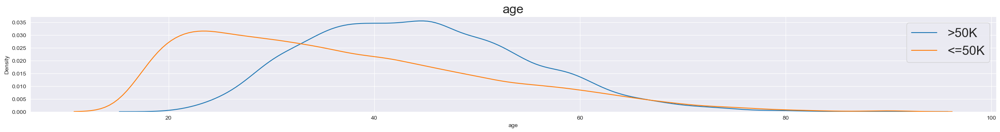

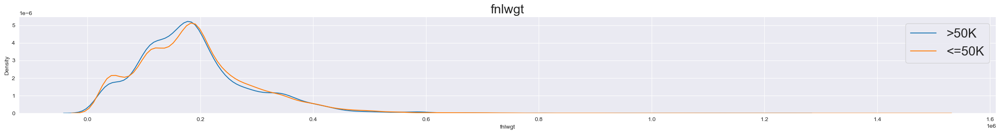

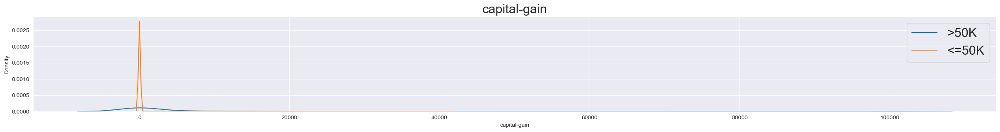

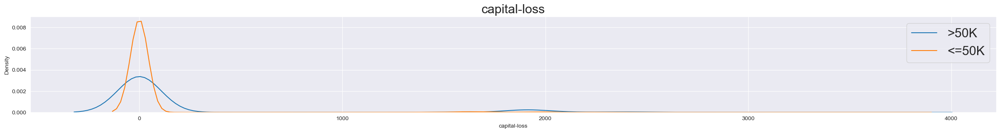

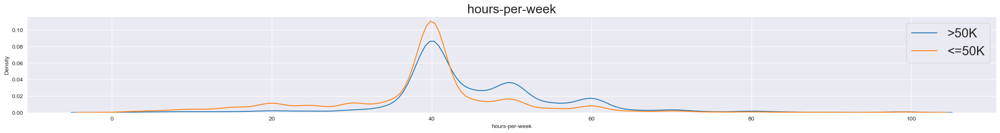

In [50]:
# Visualize numerical variable distribution per class using KDE (Kernel Density Estimation) plots

for col in numerical_features:
    plt.figure(figsize=(30,3))
    sns.kdeplot(df_train.loc[df.target=='>50K',col], label='>50K')
    sns.kdeplot(df_train.loc[df.target=='<=50K',col], label='<=50K')
    plt.legend(fontsize=22)
    plt.title(col, fontsize=22);

capital-gain: Most individuals have zero or close to zero capital gain, with a few outliers with high capital. For example: 99K capital gains in the >50k group.  
capital-loss: Most individual have zero or close to zero capital loss, with a few outlier from both groups but ranging the same amounts.

### Since many statistical techniques assume that the data follows a normal distribution, lets check that is indeed the case.

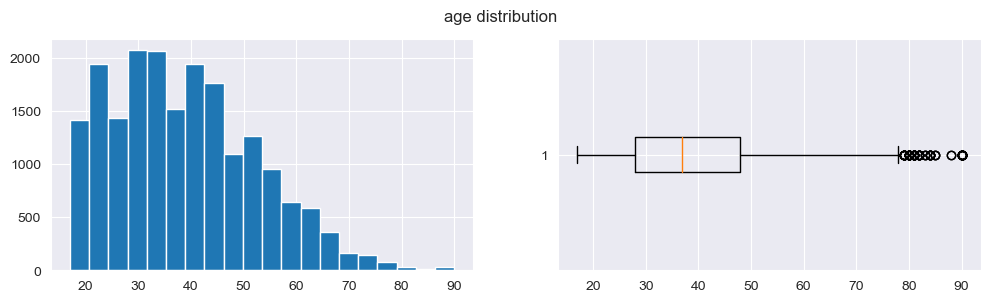

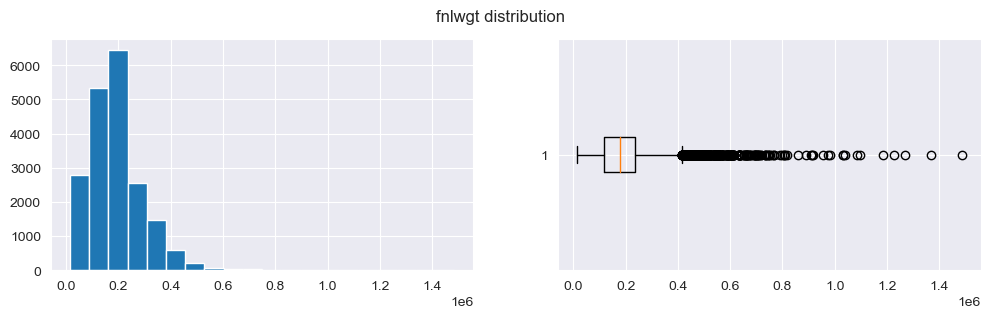

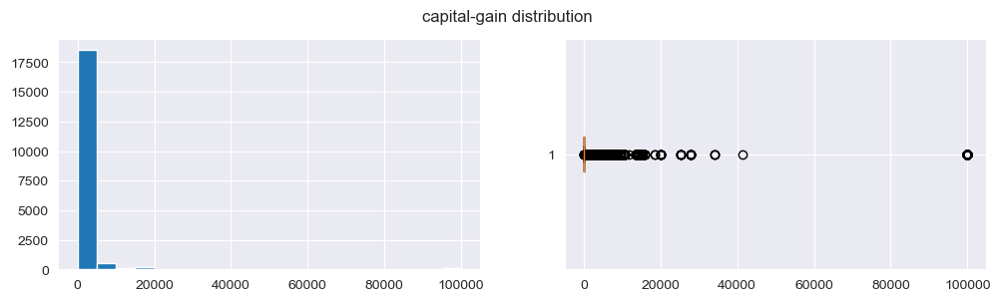

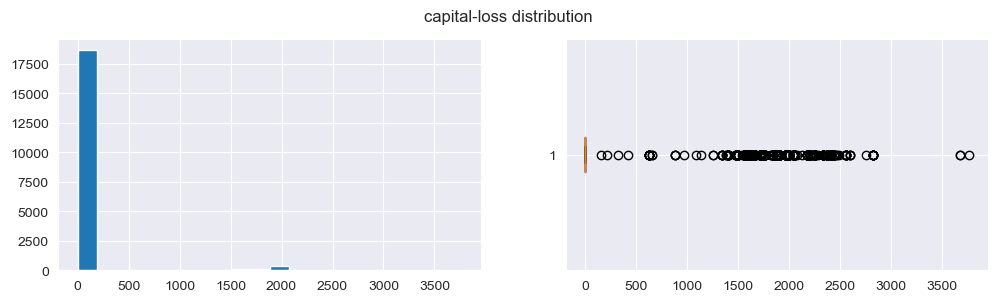

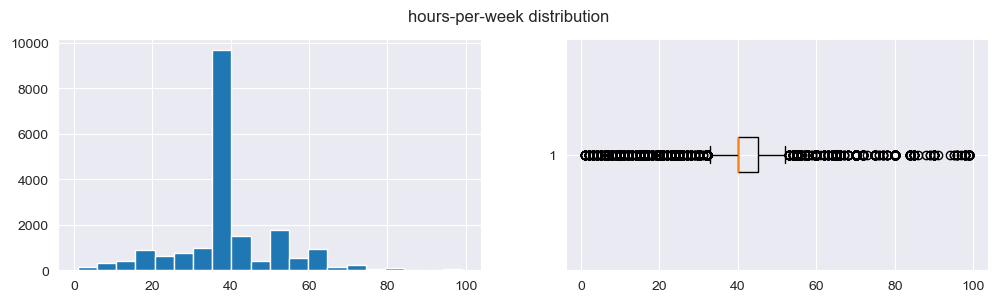

In [51]:
for col in numerical_features:
    fig, axes = plt.subplots(1, 2, figsize=(12, 3))
    axes[0].hist(df_train[col], bins=20)
    axes[1].boxplot(df_train[col], vert=False)
    plt.suptitle(f'{col} distribution')
    plt.show()

They all seem normal except 'age' which seems to be skewed to the left. Lets apply a log transformation that can help by compressing the data towards a more normal distribution and see if its a step we will need to do in the Preprocessing stage.

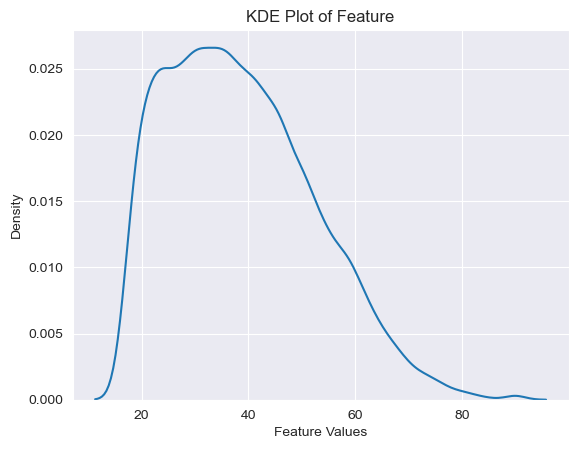

In [52]:
#Age distribution with training data
sns.kdeplot((df_train['age']))
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.title('KDE Plot of Feature')
plt.show()

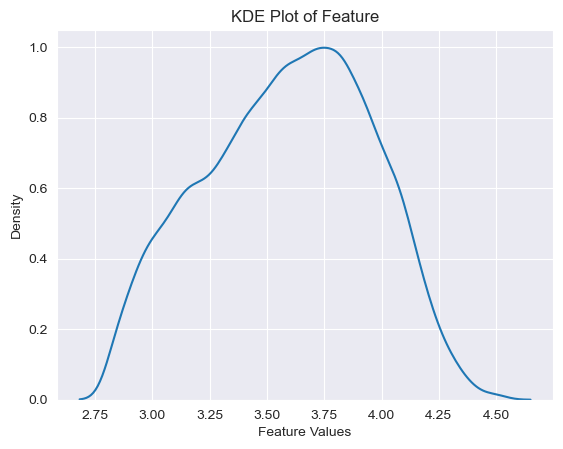

In [53]:
#Age distribution with log transformation
sns.kdeplot(np.log(df_train['age']))
plt.xlabel('Feature Values')
plt.ylabel('Density')
plt.title('KDE Plot of Feature')
plt.show()

### Look at two variables vs the target

In [54]:
#Does education and the amount of work hours relate to the target?
fig = px.density_contour(df_train, x='education', y='hours-per-week', facet_col="target")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)

fig.show()

In [55]:
# Do age and working hours per week influence income together?
fig = px.density_contour(df_train, x='age', y='hours-per-week', facet_col="target")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)

fig.show()

In [56]:
# Is the target bias to sex and race?
fig = px.density_contour(df_train, x='race', y='sex', facet_col="target")
fig.update_traces(contours_coloring="fill", contours_showlabels = True)

fig.show()

### Lets look at the distribution of features against each other (inter-correlations)

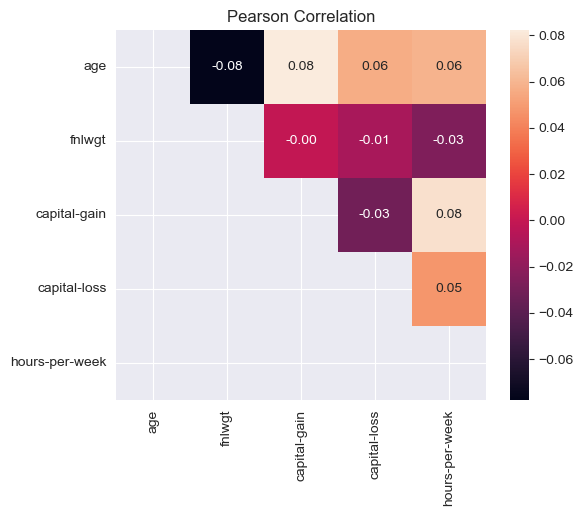

In [57]:
corr = df_train[numerical_features].corr()

mask = np.tril(np.ones_like(corr, dtype=bool))
ax = sns.heatmap(corr,
                 annot=True,
                 fmt=".2f",
                 mask = mask, square = True)
plt.title('Pearson Correlation');

The correlations between numerical features are low in general, so they are not correlated.

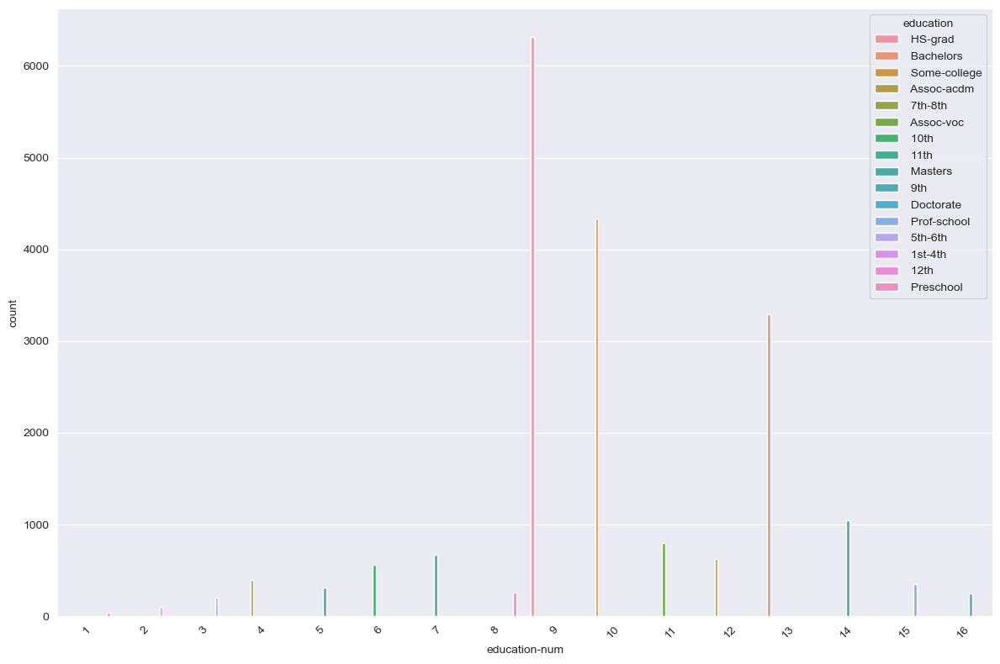

In [58]:
plt.figure(figsize=(12,8))
sns.countplot(data = df_train, x='education-num', hue='education')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [59]:
df_train['education'].value_counts(normalize=True)

education
 HS-grad        0.32
 Some-college   0.22
 Bachelors      0.17
 Masters        0.05
 Assoc-voc      0.04
 11th           0.03
 Assoc-acdm     0.03
 10th           0.03
 7th-8th        0.02
 Prof-school    0.02
 9th            0.02
 12th           0.01
 Doctorate      0.01
 5th-6th        0.01
 1st-4th        0.01
 Preschool      0.00
Name: proportion, dtype: float64

In [60]:
df_train['education-num'].value_counts(normalize=True)

education-num
9    0.32
10   0.22
13   0.17
14   0.05
11   0.04
7    0.03
12   0.03
6    0.03
4    0.02
15   0.02
5    0.02
8    0.01
16   0.01
3    0.01
2    0.01
1    0.00
Name: proportion, dtype: float64

We clearly see that education-num is a numerical representation of the variable education, so we can discard education to avoid its transformation.

## Preprocessing

### View the most frequent categories for the categorical features - notice missing values (?)


In [61]:
#from bubble_plot.utils import describe_categorical_values

#describe_categorical_values(df, non_interesting_columns=numerical_columns, num_categories=6)

**How to deal with missing values?**

(1) missing at random - imputation - using common values or estimation of the value using regression methods

(2) missing not at random - treat missing value as a separate indicator variable

### Impute missing values for categorical columns with the most common values

In [62]:
df_train[(df_train['workclass'] == ' ?') | (df_train['occupation'] == ' ?') | (df_train['native-country'] == ' ?')]

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
4627,58,?,198478,7th-8th,4,Married-civ-spouse,?,Husband,White,Male,0,0,24,United-States,<=50K
23176,18,?,78181,HS-grad,9,Never-married,?,Own-child,White,Female,0,0,20,United-States,<=50K
29881,71,?,181301,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,0,40,United-States,<=50K
11423,36,Private,135162,HS-grad,9,Never-married,Sales,Own-child,White,Male,0,0,45,?,<=50K
187,53,?,135105,Bachelors,13,Divorced,?,Not-in-family,White,Female,0,0,50,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,17,?,333100,10th,6,Never-married,?,Own-child,White,Male,1055,0,30,United-States,<=50K
13646,62,?,129246,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,0,40,United-States,<=50K
3969,59,?,117751,Assoc-acdm,12,Divorced,?,Not-in-family,White,Male,0,0,8,United-States,<=50K
21455,24,?,256240,7th-8th,4,Married-civ-spouse,?,Own-child,White,Male,0,0,60,United-States,<=50K


The samples with missing value in native-country we can replace with the most common value, for occupation and workclass which have a more spread distribution between categories, so we will replace '?' with values that maintain the original distribution, choosen at random.

In [63]:
#Replace ' ?' in native-country with ' United-States'
X_train.replace(' ?', ' United-States', inplace=True)
X_test.replace(' ?', ' United-States', inplace=True)
X_val.replace(' ?', ' United-States', inplace=True)

In [64]:
X_train.replace(' ?', np.nan, inplace=True)
for column in X_train.columns:
    # Check if the column contains missing values
    if X_train[column].isna().any():
        # Compute the value counts of the non-missing values
        value_counts = X_train[column].value_counts(normalize=True)
        # Replace missing values with values sampled from the value counts distribution
        X_train[column].fillna(pd.Series(np.random.choice(value_counts.index, p=value_counts.values, size=len(X_train))), inplace=True)

In [65]:
#Replace the missing data from the test set with the distribution of the training set
X_test.replace(' ?', np.nan, inplace=True)
for column in X_train.columns:
    if X_test[column].isna().any():
        value_counts = X_train[column].value_counts(normalize=True)
        X_test[column].fillna(pd.Series(np.random.choice(value_counts.index, p=value_counts.values, size=len(X_test))), inplace=True)

In [66]:
#Replace the missing data from the validation set with the distribution of the training set
X_val.replace(' ?', np.nan, inplace=True)
for column in X_train.columns:
    if X_val[column].isna().any():
        value_counts = X_train[column].value_counts(normalize=True)
        X_val[column].fillna(pd.Series(np.random.choice(value_counts.index, p=value_counts.values, size=len(X_val))), inplace=True)

In [67]:
#Lets double check we dont have any remaining missing values
assert(X_train.isna().any().sum() == 0)
assert(X_test.isna().any().sum() == 0)
assert(X_val.isna().any().sum() == 0)

### Remove infrequent categorical values

Removing outliers from our dataset depends on the nature of the data, the goal of the analysis, and the statistical method used. In this case, I think an outlier represents a genuine extreme value in the dataset and removing it could lead to an inaccurate model of the real-world situation. Furthermore, in some instances if we remove the infrequent values like in the case of 'capital-gain' or 'native-country' we would be left with only one category rendering the complete feature obsolute.

When we get to the feature selection phase, we will further investigated if a variable/feature is irrelevant or redundant and could decrease the accuracy of many of our models.

In [68]:
#from bubble_plot.utils import remove_infrequent_values

#df = remove_infrequent_values(df, categorical_columns)

In [69]:
fig = px.bar(df_train[df_train['native-country']!= ' United-States'], x='native-country', color = 'target')
fig.update_traces(dict(marker_line_width=0))

### Covert categorical ordinal variables to numerical discrete

The only categorical ordinal variable we have seen is education but we already have a variable that represents education numerically 'education-num'. So there is no need to transform the variable but instead we can just drop it.

In [70]:
X_train = X_train.drop('education', axis=1)
X_test = X_test.drop('education', axis=1)
X_val = X_val.drop('education', axis=1)

In [71]:
X_train.sample(1)

,age,workclass,fnlwgt,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
8139,39,Local-gov,229651,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States


### Convert categorical variables to dummy variables

In [72]:
X_train = pd.get_dummies(X_train, columns=[col for col in categorical_features if col not in ['target', 'education-num', 'education']], drop_first=True)
X_test = pd.get_dummies(X_test, columns=[col for col in categorical_features if col not in ['target', 'education-num', 'education']], drop_first=True)
X_val = pd.get_dummies(X_val, columns=[col for col in categorical_features if col not in ['target', 'education-num', 'education']], drop_first=True)

When we split our data into training, validation, and test sets, we might encounter a problem: not all categories of each feature are present in each set. So, when we transform those categories into dummy features we need to verify and modify if neccesary that the test, and validation sets have the same dummy features as our training set.

In [73]:
drop_from_test = set(X_test) - set(X_train)
drop_from_val = set(X_val) - set(X_train)
extra_from_test = set(X_train) - set(X_test)
extra_from_val = set(X_train) - set(X_val)
print(drop_from_test)
print(drop_from_val)
print(extra_from_test)
print(extra_from_val)

set()
set()
{'workclass_ Never-worked', 'native-country_ Holand-Netherlands'}
{'native-country_ Holand-Netherlands'}


In [74]:
#Add the missing features
X_test['workclass_ Never-worked'] = 0
X_test['native-country_ Holand-Netherlands'] = 0
X_val['native-country_ Holand-Netherlands'] = 0

In [75]:
X_train.shape, X_test.shape, X_val.shape

((19536, 84), (6513, 84), (6512, 84))

In [76]:
# Check if both DataFrames have the same columns
if set(X_train.columns) == set(X_test.columns):
    # If they do, reorder the columns
    X_test = X_test[X_train.columns]
else:
    print("DataFrames have different columns.")

In [77]:
# Check if both DataFrames have the same columns
if set(X_train.columns) == set(X_val.columns):
    # If they do, reorder the columns
    X_val = X_val[X_train.columns]
else:
    print("DataFrames have different columns.")

In [78]:
#Transform our target into binary
y_train[y_train=='>50K'] = 1
y_train[y_train=='<=50K'] = 0
y_test[y_test=='>50K'] = 1
y_test[y_test=='<=50K'] = 0
y_val[y_val=='>50K'] = 1
y_val[y_val=='<=50K'] = 0

### Transform the numerical features that are not normally distributed

We saw in our EDA that the variable 'age' was skewed to the left, and by applying a log transformation to it, it visually looked normally distributed. So we will replace the 'age' column in our DataFrame with a version where the natural logarithm has been applied to all values.

In [79]:
# Apply the log transformation to the 'age' column
X_train['age'] = np.log(X_train['age'])
X_test['age'] = np.log(X_test['age'])
X_val['age'] = np.log(X_val['age'])

### Scaling

We have seen that our data is normally distributed within each feature and scales, trying Standard Scaling might be a good idea.

And since our plan is to use models that assume normality (like linear regression, logistic regression, linear discriminant analysis, etc.), or models that use distance-based metrics (like k-nearest neighbors, support vector machines, etc.), then standardizing the features can be beneficial.

In [80]:
means = X_train.mean()
print(f'Means of features, min mean: {means.min():.2f}, max mean: {means.max():.2f}')
stds = X_train.std()
print(f'Standard deviations of features, min STD: {stds.min():.2f}, max STD: {stds.max():.2f}')

Means of features, min mean: 0.00, max mean: 189793.50
Standard deviations of features, min STD: 0.01, max STD: 106486.96


In [81]:
#Let's scale
st_scaler = StandardScaler()
st_scaler.fit(X_train)
X_train = pd.DataFrame(st_scaler.transform(X_train), columns=X_train.columns)

In [82]:
means_st = X_train.mean()
print(f'Means of features, min mean: {means_st.min():.2f}, max mean: {means_st.max():.2f}')
stds_st = X_train.std()
print(f'Standard deviations of features, min STD: {stds_st.min():.2f}, max STD: {stds_st.max():.2f}')

Means of features, min mean: -0.00, max mean: 0.00
Standard deviations of features, min STD: 1.00, max STD: 1.00


In [83]:
#Scale the test and validation set
X_test = pd.DataFrame(st_scaler.transform(X_test), columns=X_test.columns)
X_val = pd.DataFrame(st_scaler.transform(X_val), columns=X_val.columns)

## Feature Selection

### Mutual Information Method

Now, we will select features using the Mutual Information method, which was the advantage of capturing any kind of relationship (linear, non-linear, or even complex interaction) between variables, and it can be used with both numerical and categorical features. We cannot use the Chi2 test to assess the correlation between our categorical features and the target, because scaling our data has resulted in negative values.

In addition to Mutual Information, we will use the Recursive Feature Elimination (RFE) wrapper method for feature selection.

In [84]:
X_train.sample(1)

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,...,native-country_ Portugal,native-country_ Puerto-Rico,native-country_ Scotland,native-country_ South,native-country_ Taiwan,native-country_ Thailand,native-country_ Trinadad&Tobago,native-country_ United-States,native-country_ Vietnam,native-country_ Yugoslavia
13877,-1.51,-0.14,0.74,-0.15,-0.21,-0.44,-0.26,-0.02,0.65,-0.19,...,-0.04,-0.06,-0.02,-0.05,-0.04,-0.03,-0.02,0.31,-0.04,-0.02


In [ ]:
# Assume X_train is your feature matrix and y_train is the target vector
mi_scores = mutual_info_classif(X_train, list(y_train))

mi_scores = pd.Series(mi_scores, index=X_train.columns)
mi_scores.sort_values(ascending=False, inplace=True)

# Bar plot of mutual information scores
plt.figure(figsize=(12, 8))
sns.barplot(x=mi_scores.index, y=mi_scores)
plt.title('Mutual Information Scores')
plt.xticks(rotation=90)
plt.show()

Mutual information quantifies the dependence between variables, but it does not indicate the nature of the relationship. The relationship could be linear, non-linear, or even a more complex interaction.

What we can say certainly is that features with a score of 0 mean that there is no association between the variables and they are independent.So, they are not useful for prediction and could potentially be dropped.

### Wrapper Method

In [86]:
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_val, list(y_train), list(y_val))
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [03:59<00:00,  8.27s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
NearestCentroid,0.77,0.80,0.80,0.79,0.23
BernoulliNB,0.80,0.79,0.79,0.81,0.31
LGBMClassifier,0.87,0.79,0.79,0.86,0.91
XGBClassifier,0.87,0.79,0.79,0.86,7.11
RandomForestClassifier,0.85,0.77,0.77,0.85,10.22
AdaBoostClassifier,0.86,0.77,0.77,0.85,4.45
LogisticRegression,0.85,0.76,0.76,0.85,0.62
CalibratedClassifierCV,0.85,0.76,0.76,0.84,5.19
LinearSVC,0.85,0.76,0.76,0.84,10.69


Evaluating prediction models, we have decided to base our selection on the F1-score rather than accuracy. This decision is driven by the understanding that our dataset is unbalanced, rendering accuracy a less reliable measure for model performance.

Looking at the results, it's noticable that the 'LGBMClassifier', 'XGBClassifier', 'RandomForestClassifier', 'AdaBoostClassifier', and 'Logistic Regression' models all yield comparatively high F1-scores of around 85%. However, both 'LGBMClassifier' and 'XGBClassifier' stand out slightly with an F1-score of 86%. Thus, these models demonstrate robust performance in handling our dataset.

Now our strategy will be to apply the wrapper method, using the 'LGBMClassifier' as our foundational model, since it has a faster run time than the 'XGBClassifier'.

In [87]:
#clf = LGBMClassifier(random_state=0)

#n = X_train.shape[1]

# Empty list to store scores
#f1_scores = []

#for i in tqdm(range(1, n+1)):
#    rfe = RFE(estimator=clf, n_features_to_select=i)
#    rfe.fit(X_train, list(y_train))

    # You can score the model here using the validation set and store the F1-score
#    y_pred = rfe.predict(X_val)
#    f1 = f1_score(list(y_val), list(y_pred), average='weighted')  # you can choose other options for average parameter depending on your task
#    f1_scores.append(f1)

In [88]:
#with open('rfe_lgbm.pkl', 'wb') as f:
#    pickle.dump(f1_scores, f)

In [89]:
with open('rfe_lgbm.pkl', 'rb') as f:
    rfe = pickle.load(f)

In [90]:
rfe

[0.6552990268074066,
 0.6579229027411363,
 0.7551776963652346,
 0.7704281078717853,
 0.7909203068903236,
 0.8240020753651996,
 0.8504110534224071,
 0.8543191837144625,
 0.8545751996868797,
 0.8522373843206049,
 0.8567467438940795,
 0.8561631040719727,
 0.8548107069938057,
 0.855884864725348,
 0.8553145442180603,
 0.8605239057798058,
 0.8607597993347379,
 0.860065535548072,
 0.8592885688378148,
 0.8570013859270057,
 0.8605975936040581,
 0.8606202207034049,
 0.8617145892821569,
 0.8625295327485637,
 0.8617598871009412,
 0.8620715375902549,
 0.8618773389343135,
 0.8611786865055769,
 0.860837805447131,
 0.8626307958511517,
 0.8645027894285515,
 0.8616368084763939,
 0.8632290201164816,
 0.8626693792295759,
 0.8607206794551074,
 0.8621871307351405,
 0.8614189804525691,
 0.8619163337039908,
 0.8617145892821569,
 0.8623897116673247,
 0.8623124431184778,
 0.8623124431184778,
 0.8625533979083554,
 0.8626693792295759,
 0.8624522765376359,
 0.8645789591244136,
 0.8641460584192666,
 0.8629491485838

In [91]:
rfe.index(max(rfe)), rfe[rfe.index(max(rfe))]

(45, 0.8645789591244136)

Analyzing the F1-scores for each iteration, corresponding to every possible number of features, we get that the maximum score of 0.86457 is attained with 45 features. However, it's worth noting that an F1-score higher than 86% is consistently achieved starting from just 16 features.

In order to maintain a balance between performance and model complexity, a compromise could be made choosing 24 features. Despite having nearly half as many features as the optimal scenario, this setup achieves a F1-score of 0.8625, which is remarkably close to the maximum score. Thus, this approach reduces model complexity without significantly compromising the model's performance.

In [92]:
clf = LGBMClassifier(random_state=0)

rfe = RFE(estimator=clf, n_features_to_select=24)
rfe.fit(X_train, list(y_train))

RFE(estimator=LGBMClassifier(random_state=0), n_features_to_select=24)

In [93]:
#So Which features should we eliminate based on the classifier?
total_features = len(X_train.columns)
elim = list(set(X_train)-set(X_train.iloc[:,rfe.support_].columns))
print(f' The following {len(elim)} features should be eliminated :\n {elim}')

 The following 60 features should be eliminated :
 ['occupation_ Priv-house-serv', 'native-country_ India', 'workclass_ Self-emp-inc', 'native-country_ Cuba', 'occupation_ Armed-Forces', 'native-country_ Honduras', 'relationship_ Unmarried', 'native-country_ Outlying-US(Guam-USVI-etc)', 'native-country_ Jamaica', 'native-country_ Philippines', 'native-country_ Japan', 'native-country_ Guatemala', 'native-country_ China', 'native-country_ Poland', 'native-country_ Laos', 'native-country_ Nicaragua', 'native-country_ Taiwan', 'native-country_ Trinadad&Tobago', 'marital-status_ Widowed', 'native-country_ Yugoslavia', 'relationship_ Other-relative', 'native-country_ Scotland', 'occupation_ Protective-serv', 'native-country_ Greece', 'native-country_ Puerto-Rico', 'native-country_ Iran', 'occupation_ Machine-op-inspct', 'native-country_ Hungary', 'race_ Black', 'race_ Asian-Pac-Islander', 'occupation_ Transport-moving', 'marital-status_ Married-spouse-absent', 'native-country_ Italy', 'nati

In [94]:
#Features Kept
print('Features we should keep')
X_train.iloc[:,rfe.support_].columns

Features we should keep


Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ Local-gov', 'workclass_ Private',
       'workclass_ Self-emp-not-inc', 'workclass_ State-gov',
       'marital-status_ Married-civ-spouse', 'marital-status_ Never-married',
       'occupation_ Craft-repair', 'occupation_ Exec-managerial',
       'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners',
       'occupation_ Other-service', 'occupation_ Prof-specialty',
       'occupation_ Sales', 'occupation_ Tech-support',
       'relationship_ Own-child', 'relationship_ Wife', 'race_ White',
       'sex_ Male'],
      dtype='object')

Reviewing the features we should keep, it is noticeable that all the numerical features remain. Furthermore, the categorical features with substantial representation, as noted in our Exploratory Data Analysis (EDA), have also been maintained. These include features such as 'race_White', 'workclass_Private', and 'marital-status_Married-civ-spouse', among others.

As expected, there is an overlap between these selected features and those that secured higher Mutual Information (MI) scores in our previous analysis. This congruity provides us with increased confidence in the validity and usefulness of these features.

Therefore, given the alignment between our EDA, MI scoring, and feature selection process, we will proceed with this set of 24 features. This strikes a balance between model complexity and performance, ensuring our model is both manageable and highly efficient but also easier to interpret.

Interestingly despite our initial assesment, the variable 'fnlwgt', which seemed to hold limited predictive value due to its homogeneous distribution as observed in our earlier analysis, has been included in all feature selection methods we have implemented, suggesting that it may indeed play a role in the model's predictive capability.

In [95]:
X_train = X_train.iloc[:,rfe.support_]
X_test = X_test.iloc[:,rfe.support_]
X_val = X_val.iloc[:,rfe.support_]

In [96]:
X_train.shape, X_test.shape, X_val.shape

((19536, 24), (6513, 24), (6512, 24))

## Model Selection

###  Cross validation

Now we are going to perform Cross Validation to ensure that the predictive performance of our model is not based on a particular random arrangement of the data. Assessing the model's ability to generalize when making predictions on unseen data. Cross-validation will help reduce the chance of overfitting, and aid in hyperparameter tuning later.


We have selected Stratified K-Fold Cross Validation since it is particularly beneficial for unbalanced datasets due to the way it divides the dataset into folds. Stratified K-Fold Cross Validation preserves the class distribution in each fold, it ensures that each fold is a good representative of the whole dataset by maintaining the same proportion of classes in each fold as they are in the whole dataset.

In [97]:
X_train_valid = pd.concat([X_train,X_val],axis=0)
y_train_valid = pd.concat([y_train, y_val], axis=0)

In [98]:
def print_val_scores(scores, extra_info=False):
    print(f'Cross validation scores: mean: {np.mean(scores):.3f}, all: {[round(score, 3) for score in scores]}')
    if extra_info:
        print(f'(std: {np.std(scores):.3f}, min: {min(scores):.3f}, max: {max(scores):.3f})')

In [99]:
#Cross validation for LGBMClassifier
skf = StratifiedKFold(n_splits=5)

cv_scores = cross_val_score(LGBMClassifier(random_state=0),
                         X_train_valid,
                         list(y_train_valid),
                         cv=skf,
                         scoring=make_scorer(f1_score, average='weighted'))

print_val_scores(cv_scores, extra_info=True)

Cross validation scores: mean: 0.865, all: [0.862, 0.865, 0.871, 0.868, 0.861]
(std: 0.004, min: 0.861, max: 0.871)


In [100]:
#Cross validation for XGBClassifier
skf = StratifiedKFold(n_splits=5)

cv_scores = cross_val_score(XGBClassifier(random_state=0),
                         X_train_valid,
                         list(y_train_valid),
                         cv=skf,
                         scoring=make_scorer(f1_score, average='weighted'))

print_val_scores(cv_scores, extra_info=True)

Cross validation scores: mean: 0.863, all: [0.861, 0.862, 0.869, 0.869, 0.854]
(std: 0.005, min: 0.854, max: 0.869)


In [101]:
#Cross validation with RandomForestClasifier
skf = StratifiedKFold(n_splits=5)

cv_scores = cross_val_score(RandomForestClassifier(random_state=0),
                         X_train_valid,
                         list(y_train_valid),
                         cv=skf,
                         scoring=make_scorer(f1_score, average='weighted'))

print_val_scores(cv_scores, extra_info=True)

Cross validation scores: mean: 0.851, all: [0.848, 0.848, 0.855, 0.855, 0.849]
(std: 0.003, min: 0.848, max: 0.855)


In [102]:
#Cross validation with AdaBoostClassifier
skf = StratifiedKFold(n_splits=5)

cv_scores = cross_val_score(AdaBoostClassifier(random_state=0),
                         X_train_valid,
                         list(y_train_valid),
                         cv=skf,
                         scoring=make_scorer(f1_score, average='weighted'))

print_val_scores(cv_scores, extra_info=True)

Cross validation scores: mean: 0.854, all: [0.85, 0.85, 0.862, 0.858, 0.85]
(std: 0.005, min: 0.850, max: 0.862)


In [103]:
#Cross validation with LogisticRegresion
skf = StratifiedKFold(n_splits=5)

cv_scores = cross_val_score(LogisticRegression(),
                         X_train_valid,
                         list(y_train_valid),
                         cv=skf,
                         scoring=make_scorer(f1_score, average='weighted'))

print_val_scores(cv_scores, extra_info=True)

Cross validation scores: mean: 0.846, all: [0.839, 0.84, 0.855, 0.857, 0.84]
(std: 0.008, min: 0.839, max: 0.857)


Cross validation across multiple models show the 'LGBMClassifier' using default parameters as the top performer with the highest max and min, and the second lowest deviation. The results are consistent with previous results, but this scores were obtained from a different dataset (X_train + X_val).

These results suggest a high level of model performance and reliability.

## Hyper-parameter tuning for LGBM Model

In [104]:
def print_search_results(est):

    means = est.cv_results_['mean_test_score']
    stds = est.cv_results_['std_test_score']
    params_all = est.cv_results_['params']
    print('\nScores on validation set:')
    for mean_score, std_score, params in zip(means, stds, params_all):
        print(f'{mean_score:.3f} (+/-{(std_score * 2):.3f}) for {params}\n')

    print('Best parameters set found on validation set:', est.best_params_)
    print(f'Best validation score: {est.best_score_:.3f}')

In [105]:
#params_dict_reg = {
#    'num_leaves': range(30, 70),
#    'min_child_samples': range(100, 500, 50),
#    'max_depth': range(5, 15),
#    'learning_rate': [0.005, 0.01, 0.02, 0.05, 0.1, 0.2],
#    'n_estimators': range(100, 1000, 100),
#    'subsample': np.arange(0.6, 1.0, 5),
#    'colsample_bytree': np.arange(0.5, 1.0, 5),
#    'reg_lambda': np.logspace(-2, 2, 5),
#    'reg_alpha': np.logspace(-2, 2, 5),
#}


#clf_rgs = RandomizedSearchCV(LGBMClassifier(random_state=0),
#                             params_dict_reg,
#                             cv=skf,
#                             random_state=0,
#                             n_iter=200,
#                             scoring=make_scorer(f1_score, average='weighted'))

#clf_rgs.fit(X_train_valid, list(y_train_valid))


In [106]:
#print_search_results(clf_rgs)

The Randomized Search algorithm selected the LGBM model with the following parameters: 'subsample': 0.6, 'reg_lambda': 1.0, 'reg_alpha': 1.0, 'num_leaves': 50, 'n_estimators': 200, 'min_child_samples': 150, 'max_depth': 6, 'learning_rate': 0.1, 'colsample_bytree': 0.5. This was determined based on the highest mean score achieved across all folds of the cross-validation process.

With these set of new parameters the best validation score was: 0.866, an slight improvement on the mean f1-score obtained using the default parameters 0.865.

The default parameters for LightGBM are already quite good, as they have been chosen to perform reasonably well across a variety of datasets and tasks. However, tuning hyperparameters was still a valuable process. Even though the performance improvement might be small in this case, it ensures that we are not leaving any performance on the table by using suboptimal settings.

## Model Metrics

In [107]:
#Predictions

clf = LGBMClassifier(subsample= 0.6, reg_lambda= 1.0, reg_alpha= 1.0, num_leaves= 50, n_estimators= 200, min_child_samples= 150, max_depth= 6, learning_rate= 0.1, colsample_bytree= 0.5, random_state= 0)
clf.fit(X_train_valid,list(y_train_valid))
y_pred = clf.predict(X_test)

In [108]:
print(f'Classification Report: \n{classification_report(list(y_test), y_pred, labels=[0, 1])}')

Classification Report: 
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      4945
           1       0.78      0.62      0.69      1568

    accuracy                           0.87      6513
   macro avg       0.83      0.78      0.80      6513
weighted avg       0.86      0.87      0.86      6513



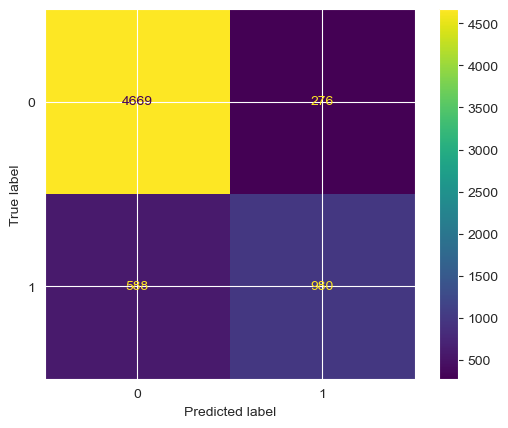

In [109]:
cm = confusion_matrix(list(y_test), y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot();

In [110]:
y_test.value_counts(normalize=True)

target
0   0.76
1   0.24
Name: proportion, dtype: float64

The baseline model we are comparing our predictive model to is a dummy variable model. In this baseline model, the predicted results are distributed in the same way as the target labels, in this case the '0' (<=50K) category had a 0.76 weight and the '1' (>50K) category had 0.24.

For class '0' (<=50K):
Precision for '0' = Weight of '0' = 0.76
Recall for '0' = Weight of '0' = 0.76
F1-score for '0' = 0.76


For class '1' (>50K):
Precision for '1' = Weight of '1' = 0.24
Recall for '1' = Weight of '1' = 0.24
F1-score for '1' = 0.24


Macro F1-score = (F1_0 + F1_1) / 2  = 0.50
Weighted F1-score = (Weight_0 * F1_0 + Weight_1 * F1_1) = 0.6584

-The weighted f1-score (0.86) of the LGBM model on the test data improves significantly from the baseline model (0.658). So the performance on new data did well overall.

-For the category <=50k (0) we see a high recall and precision and therefore a high f1-score (0.92), meaning our model is predicting this category quite well, only 276 missed classified labels and 4669 correctly predicted so around 0.94, compared to the 0.76 of the baseline.

-For the category >50k (1) we know from our unbalanced data that is the less frequent category. Nevertheless, the f1-score (0.69) is modest specially compared to the 0.24 of the baseline. The model miss labels 588 out of 1568 test samples and correctly predicted 980.


In [111]:
clf.predict_proba(X_test)

array([[0.65171296, 0.34828704],
       [0.97973692, 0.02026308],
       [0.90058016, 0.09941984],
       ...,
       [0.99235819, 0.00764181],
       [0.52903145, 0.47096855],
       [0.41368538, 0.58631462]])

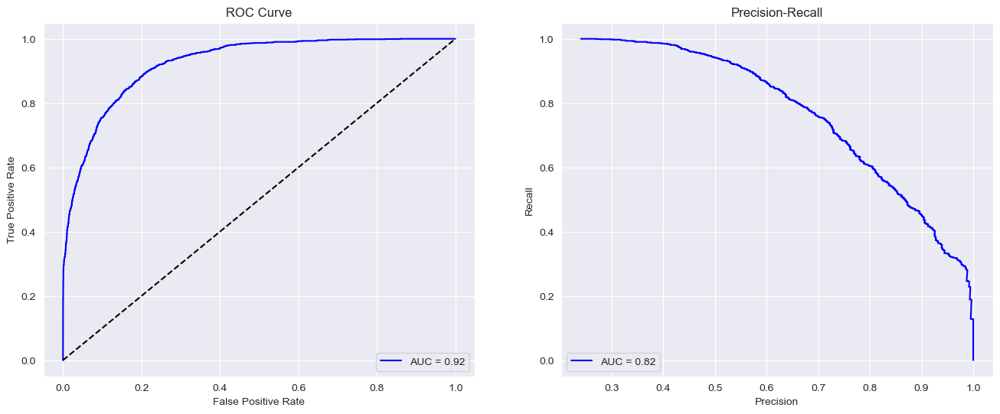

In [112]:
y_probs = clf.predict_proba(X_test)[:,1]
fpr, tpr, thresholds_roc = roc_curve(list(y_test), y_probs)
roc_auc = auc(fpr, tpr)

precision, recall, thresholds_pr = precision_recall_curve(list(y_test), y_probs)
pr_auc = auc(recall, precision)

f, ax = plt.subplots(1, 2, figsize = (16, 6))
ax[0].plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
ax[0].plot([0, 1], [0, 1], '--k')
ax[0].set(title = 'ROC Curve', xlabel = 'False Positive Rate', ylabel = 'True Positive Rate')
ax[0].legend(loc = 'lower right')

ax[1].plot(precision, recall, 'b', label = 'AUC = %0.2f' % pr_auc)
ax[1].set(title = 'Precision-Recall', xlabel = 'Precision', ylabel = 'Recall')
ax[1].legend(loc = 'lower left')

plt.show()

The ROC curve is closer to the top-left corner, meaning a good model's performance. This indicates a higher TPR and a lower FPR, suggesting that our model can effectively discriminate between classes.

The area under the ROC curve (AUC) is a common metric used to summarize the overall performance of the model. A higher AUC value (closer to 1) indicates better discrimination ability and overall model performance and in this case we have an AUC of 0.92.

## Interpretability

age Score: 609.00
fnlwgt Score: 521.00
education-num Score: 310.00
capital-gain Score: 294.00
capital-loss Score: 237.00
hours-per-week Score: 341.00
workclass_ Local-gov Score: 20.00
workclass_ Private Score: 34.00
workclass_ Self-emp-not-inc Score: 44.00
workclass_ State-gov Score: 20.00
marital-status_ Married-civ-spouse Score: 88.00
marital-status_ Never-married Score: 29.00
occupation_ Craft-repair Score: 29.00
occupation_ Exec-managerial Score: 57.00
occupation_ Farming-fishing Score: 40.00
occupation_ Handlers-cleaners Score: 26.00
occupation_ Other-service Score: 33.00
occupation_ Prof-specialty Score: 56.00
occupation_ Sales Score: 31.00
occupation_ Tech-support Score: 26.00
relationship_ Own-child Score: 19.00
relationship_ Wife Score: 50.00
race_ White Score: 40.00
sex_ Male Score: 46.00


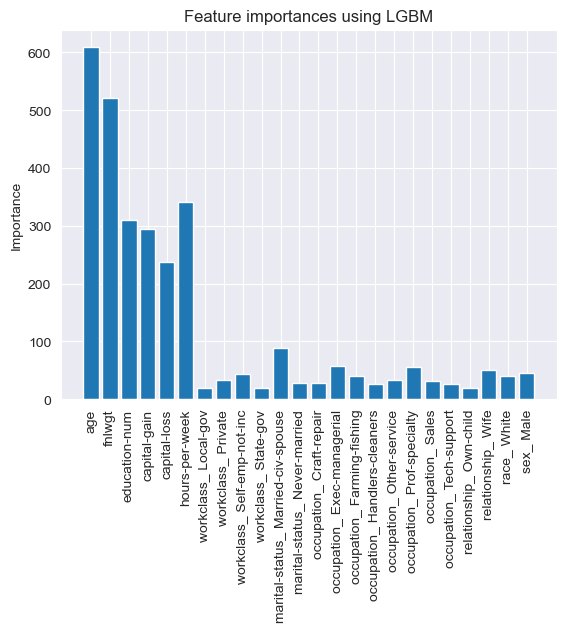

In [113]:
# Fit the LGBMClassifier
clf = LGBMClassifier()
clf.fit(X_train, list(np.ravel(y_train)))

# Get feature importances
importance = clf.feature_importances_

# Print feature importance
for i,v in enumerate(importance):
    print(f'{X_train.columns[i]} Score: %.2f' % v)

# Plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.xticks(range(len(X_train.columns)), X_train.columns, rotation = 90)
plt.title("Feature importances using LGBM")
plt.ylabel("Importance");

These importance scores provide insights into the relative contributions or importance of each feature in the construction of the boosted decision trees within the LGBM model. Features with higher scores are those that contribute more significantly to the model's decision-making process.

According to the LGBM analysis, the "age" feature has the highest importance score, suggesting that it has the most substantial impact on the model's predictions. "Fnlwgt" also demonstrates a high importance score, indicating its strong influence in the model. However, it's worth noting that all other features also contribute to the model's predictive power, as none of them have an importance score of '0'. This reassures the validity of the feature selection process performed, as each feature plays a role in the model's overall performance.
However, it is important to note that:

1. Feature importance scores do not indicate the direction of the relationship between the feature and the target.

2. High correlation between two or more features may cause their importance to be distributed among them, which may understate the individual importance of each correlated feature.

3. The importance scores are all relative and do not indicate the "absolute" importance of the features.

4. While feature importance gives us a sense of which variables are more influential in predictions, it does not imply a cause-and-effect relationship.

So, while feature importance provides valuable insights, it should be interpreted in light of the above considerations and within the broader context of the data and the model's overall performance.

## Using SHAP

SHAP Values come from game theory and provide a way to allocate the contribution of each feature to the prediction for each individual instance. In other words, they provide a way to "fairly" distribute the contribution of each feature to the prediction for a particular instance among the features.

In contrast with feature importance which gives us a global measure of the importance of a feature, averaged over all instances, but doesn't tell us how the feature affects the prediction for each individual instance.
SHAP values provide a more detailed view, providing the contribution of each feature to the prediction for each individual instance. They also tell us the direction of the relationship.

In [114]:
# Create a copy of your test set
X_test_unscaled = X_test.copy()

# Unscaled the 'age' feature in the copy
X_test_unscaled['age'] = np.exp((X_test_unscaled['age'] * np.sqrt(st_scaler.var_[0])) + st_scaler.mean_[0])

In [115]:
fp_indices = np.where((y_pred==1)&list(np.ravel(y_test)==0))
fp_df = X_test.iloc[fp_indices]

In [116]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(X_test)

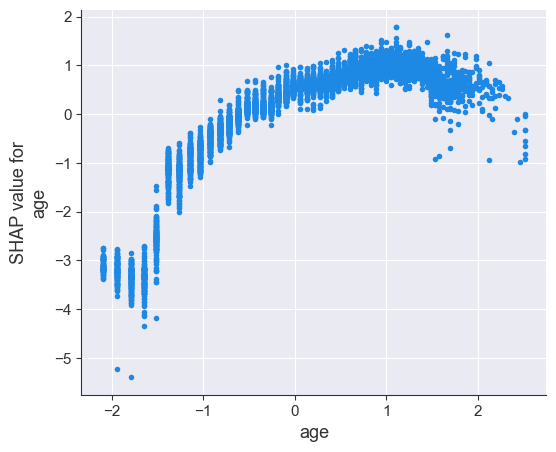

In [117]:
shap.dependence_plot(ind='age', interaction_index=None,
                     shap_values=shap_values[1],
                     features=X_test,
                     display_features=X_test_unscaled)

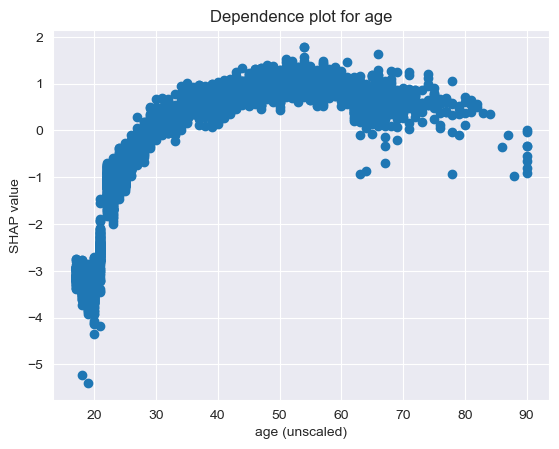

In [118]:
# Compute the SHAP values for the 'age' feature
age_shap_values = shap_values[1][:, X_test.columns.get_loc('age')]

# Create a scatter plot
plt.scatter(X_test_unscaled['age'], age_shap_values)

plt.xlabel('age (unscaled)')
plt.ylabel('SHAP value')
plt.title('Dependence plot for age')

plt.show()

We plotted two graphs to assess the dependence of the target variable on the "age" feature. The first graph shows the relationship between the target and "age" using a dataset that was scaled and transformed by a logarithmic function. The second graph displays the descaled version of the dataset for easier interpretability.

The contribution of age appears to be highest when individuals are around 20 years old or younger, and it has a negative effect on the probability of earning above that income threshold. Moreover, individuals in the age range of 40-60 years old have a more modest positive contribution to the probability of earning more than 50K.

Interestingly, for individuals over 85 and around 25 years old, both age groups seem to have a slight negative influence on the probability of earning above 50K.